In [15]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Ссылка на файл с весами моделей: https://drive.google.com/drive/folders/1z-8_IXJCk9VU0p58EbrRCWHPKRHzOTQg?usp=sharing

In [1]:
!pip install ftfy regex tqdm
!pip install git+https://github.com/openai/CLIP.git
!pip install Ninja

import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms
from torchvision.utils import save_image
import clip
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 3.1 MB/s eta 0:00:00
  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-528pddsh
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-528pddsh
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 57.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 56.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 50.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 15.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [2]:
!git clone https://github.com/rosinality/stylegan2-pytorch.git

Cloning into 'stylegan2-pytorch'...
remote: Enumerating objects: 395, done.
remote: Total 395 (delta 0), reused 0 (delta 0), pack-reused 395 (from 1)
Receiving objects: 100% (395/395), 122.51 MiB | 21.04 MiB/s, done.
Resolving deltas: 100% (205/205), done.


In [3]:
cd stylegan2-pytorch/

/content/stylegan2-pytorch


In [4]:
torch.manual_seed(345)

In [5]:
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

ids = ['1EM87UquaoQmk17Q8d5kYIAHqu0dkYqdT', '1N0MZSqPRJpLfP4mFQCS14ikrVSe8vQlL']
for file_id in ids:
  downloaded = drive.CreateFile({'id':file_id})
  downloaded.FetchMetadata(fetch_all=True)
  downloaded.GetContentFile(downloaded.metadata['title'])

In [6]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
from model import Generator
latent_dim = 512

generator_frozen = Generator(size=1024, style_dim=latent_dim, n_mlp=8).to(device)
state_dict = torch.load('/content/stylegan2-pytorch/stylegan2-ffhq-config-f.pt', map_location=device)
generator_frozen.load_state_dict(state_dict['g_ema'])
generator_frozen.eval()

generator_train = Generator(size=1024, style_dim=latent_dim, n_mlp=8).to(device)
generator_train.load_state_dict(generator_frozen.state_dict())
generator_train.train()

print("Генераторы StyleGAN2 загружены.")

/usr/local/lib/python3.11/dist-packages/torch/utils/cpp_extension.py:2059: UserWarning: TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'].
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/utils/cpp_extension.py:2059: UserWarning: TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'].
  warnings.warn(


Генераторы StyleGAN2 загружены.


In [7]:
class DirectionalCLIPLoss(torch.nn.Module):
    def __init__(self):
        super(DirectionalCLIPLoss, self).__init__()
        self.model, _ = clip.load("ViT-B/32", device=device)
        self.upsample = torch.nn.Upsample(scale_factor=7)
        self.avg_pool = torch.nn.AvgPool2d(kernel_size=1024 // 32)

    def forward(self, img_source, img_target, text_source, text_target):
        img_source = self.avg_pool(self.upsample(img_source))
        img_target = self.avg_pool(self.upsample(img_target))

        img_source_embed = self.model.encode_image(img_source)
        img_target_embed = self.model.encode_image(img_target)
        text_source_embed = self.model.encode_text(text_source)
        text_target_embed = self.model.encode_text(text_target)

        delta_img = img_target_embed - img_source_embed
        delta_text = text_target_embed - text_source_embed

        # norm
        delta_img = delta_img / delta_img.norm(dim=-1, keepdim=True)
        delta_text = delta_text / delta_text.norm(dim=-1, keepdim=True)

        #cos sim
        return 1 - (delta_img * delta_text).sum()

In [8]:
clip_loss = DirectionalCLIPLoss().to(device)

100%|███████████████████████████████████████| 338M/338M [00:04<00:00, 85.4MiB/s]


In [9]:
from torch.nn import Linear, Conv2d, BatchNorm1d, BatchNorm2d, PReLU, Dropout, Sequential, Module

"""
Modified Backbone implementation from [TreB1eN](https://github.com/TreB1eN/InsightFace_Pytorch)
"""
from collections import namedtuple
import torch
from torch.nn import Conv2d, BatchNorm2d, PReLU, ReLU, Sigmoid, MaxPool2d, AdaptiveAvgPool2d, Sequential, Module

"""
ArcFace implementation from [TreB1eN](https://github.com/TreB1eN/InsightFace_Pytorch)
"""


class Flatten(Module):
	def forward(self, input):
		return input.view(input.size(0), -1)


def l2_norm(input, axis=1):
	norm = torch.norm(input, 2, axis, True)
	output = torch.div(input, norm)
	return output


class Bottleneck(namedtuple('Block', ['in_channel', 'depth', 'stride'])):
	""" A named tuple describing a ResNet block. """


def get_block(in_channel, depth, num_units, stride=2):
	return [Bottleneck(in_channel, depth, stride)] + [Bottleneck(depth, depth, 1) for i in range(num_units - 1)]


def get_blocks(num_layers):
	if num_layers == 50:
		blocks = [
			get_block(in_channel=64, depth=64, num_units=3),
			get_block(in_channel=64, depth=128, num_units=4),
			get_block(in_channel=128, depth=256, num_units=14),
			get_block(in_channel=256, depth=512, num_units=3)
		]
	elif num_layers == 100:
		blocks = [
			get_block(in_channel=64, depth=64, num_units=3),
			get_block(in_channel=64, depth=128, num_units=13),
			get_block(in_channel=128, depth=256, num_units=30),
			get_block(in_channel=256, depth=512, num_units=3)
		]
	elif num_layers == 152:
		blocks = [
			get_block(in_channel=64, depth=64, num_units=3),
			get_block(in_channel=64, depth=128, num_units=8),
			get_block(in_channel=128, depth=256, num_units=36),
			get_block(in_channel=256, depth=512, num_units=3)
		]
	else:
		raise ValueError("Invalid number of layers: {}. Must be one of [50, 100, 152]".format(num_layers))
	return blocks


class SEModule(Module):
	def __init__(self, channels, reduction):
		super(SEModule, self).__init__()
		self.avg_pool = AdaptiveAvgPool2d(1)
		self.fc1 = Conv2d(channels, channels // reduction, kernel_size=1, padding=0, bias=False)
		self.relu = ReLU(inplace=True)
		self.fc2 = Conv2d(channels // reduction, channels, kernel_size=1, padding=0, bias=False)
		self.sigmoid = Sigmoid()

	def forward(self, x):
		module_input = x
		x = self.avg_pool(x)
		x = self.fc1(x)
		x = self.relu(x)
		x = self.fc2(x)
		x = self.sigmoid(x)
		return module_input * x


class bottleneck_IR(Module):
	def __init__(self, in_channel, depth, stride):
		super(bottleneck_IR, self).__init__()
		if in_channel == depth:
			self.shortcut_layer = MaxPool2d(1, stride)
		else:
			self.shortcut_layer = Sequential(
				Conv2d(in_channel, depth, (1, 1), stride, bias=False),
				BatchNorm2d(depth)
			)
		self.res_layer = Sequential(
			BatchNorm2d(in_channel),
			Conv2d(in_channel, depth, (3, 3), (1, 1), 1, bias=False), PReLU(depth),
			Conv2d(depth, depth, (3, 3), stride, 1, bias=False), BatchNorm2d(depth)
		)

	def forward(self, x):
		shortcut = self.shortcut_layer(x)
		res = self.res_layer(x)
		return res + shortcut


class bottleneck_IR_SE(Module):
	def __init__(self, in_channel, depth, stride):
		super(bottleneck_IR_SE, self).__init__()
		if in_channel == depth:
			self.shortcut_layer = MaxPool2d(1, stride)
		else:
			self.shortcut_layer = Sequential(
				Conv2d(in_channel, depth, (1, 1), stride, bias=False),
				BatchNorm2d(depth)
			)
		self.res_layer = Sequential(
			BatchNorm2d(in_channel),
			Conv2d(in_channel, depth, (3, 3), (1, 1), 1, bias=False),
			PReLU(depth),
			Conv2d(depth, depth, (3, 3), stride, 1, bias=False),
			BatchNorm2d(depth),
			SEModule(depth, 16)
		)

	def forward(self, x):
		shortcut = self.shortcut_layer(x)
		res = self.res_layer(x)
		return res + shortcut


class Backbone(Module):
	def __init__(self, input_size, num_layers, mode='ir', drop_ratio=0.4, affine=True):
		super(Backbone, self).__init__()
		assert input_size in [112, 224], "input_size should be 112 or 224"
		assert num_layers in [50, 100, 152], "num_layers should be 50, 100 or 152"
		assert mode in ['ir', 'ir_se'], "mode should be ir or ir_se"
		blocks = get_blocks(num_layers)
		if mode == 'ir':
			unit_module = bottleneck_IR
		elif mode == 'ir_se':
			unit_module = bottleneck_IR_SE
		self.input_layer = Sequential(Conv2d(3, 64, (3, 3), 1, 1, bias=False),
									  BatchNorm2d(64),
									  PReLU(64))
		if input_size == 112:
			self.output_layer = Sequential(BatchNorm2d(512),
			                               Dropout(drop_ratio),
			                               Flatten(),
			                               Linear(512 * 7 * 7, 512),
			                               BatchNorm1d(512, affine=affine))
		else:
			self.output_layer = Sequential(BatchNorm2d(512),
			                               Dropout(drop_ratio),
			                               Flatten(),
			                               Linear(512 * 14 * 14, 512),
			                               BatchNorm1d(512, affine=affine))

		modules = []
		for block in blocks:
			for bottleneck in block:
				modules.append(unit_module(bottleneck.in_channel,
										   bottleneck.depth,
										   bottleneck.stride))
		self.body = Sequential(*modules)

	def forward(self, x):
		x = self.input_layer(x)
		x = self.body(x)
		x = self.output_layer(x)
		return l2_norm(x)


def IR_50(input_size):
	"""Constructs a ir-50 model."""
	model = Backbone(input_size, num_layers=50, mode='ir', drop_ratio=0.4, affine=False)
	return model


def IR_101(input_size):
	"""Constructs a ir-101 model."""
	model = Backbone(input_size, num_layers=100, mode='ir', drop_ratio=0.4, affine=False)
	return model


def IR_152(input_size):
	"""Constructs a ir-152 model."""
	model = Backbone(input_size, num_layers=152, mode='ir', drop_ratio=0.4, affine=False)
	return model


def IR_SE_50(input_size):
	"""Constructs a ir_se-50 model."""
	model = Backbone(input_size, num_layers=50, mode='ir_se', drop_ratio=0.4, affine=False)
	return model


def IR_SE_101(input_size):
	"""Constructs a ir_se-101 model."""
	model = Backbone(input_size, num_layers=100, mode='ir_se', drop_ratio=0.4, affine=False)
	return model


def IR_SE_152(input_size):
	"""Constructs a ir_se-152 model."""
	model = Backbone(input_size, num_layers=152, mode='ir_se', drop_ratio=0.4, affine=False)
	return model

In [10]:
import torch
from torch import nn
import torch.nn.functional as F

class IDLoss(nn.Module):
    def __init__(self, model_weights, device='cuda'):
        super(IDLoss, self).__init__()
        print('Loading ResNet ArcFace')
        self.facenet = Backbone(input_size=112, num_layers=50, drop_ratio=0.6, mode='ir_se')
        self.facenet.load_state_dict(torch.load(model_weights))
        self.pool = torch.nn.AdaptiveAvgPool2d((256, 256))
        self.face_pool = torch.nn.AdaptiveAvgPool2d((112, 112))
        self.facenet.eval()
        self.facenet.to(device)


    def extract_feats(self, x):
        if x.shape[2] != 256:
            x = self.pool(x)
        x = x[:, :, 35:223, 32:220]
        x = self.face_pool(x)
        x_feats = self.facenet(x)
        return x_feats

    def forward(self, y_hat, y):
        n_samples = y.shape[0]
        y_feats = self.extract_feats(y)

        y_hat_feats = self.extract_feats(y_hat)

        y_feats = y_feats.detach()
        y_hat_feats = y_hat_feats.detach()


        total_loss = 0
        for i in range(n_samples):
            cos_sim = F.cosine_similarity(y_hat_feats[i:i+1], y_feats[i:i+1])
            total_loss += 1 - cos_sim
        loss = total_loss
        return loss

In [11]:
model_path = "/content/stylegan2-pytorch/model_ir_se50.pth"
id_loss = IDLoss(model_path, device)

Loading ResNet ArcFace


In [22]:
def train_domain_adaptation(g_frozen, g_train, text_source, text_target, num_steps=300, lr=0.002, display_every=100):
    clip_loss = DirectionalCLIPLoss().to(device)
    optimizer = optim.Adam(g_train.parameters(), lr=lr)

    text_source = torch.cat([clip.tokenize(text_source)]).to(device)
    text_target = torch.cat([clip.tokenize(text_target)]).to(device)

    test_z = torch.randn(1, latent_dim, device=device)

    for step in range(num_steps):
        z = torch.randn(1, latent_dim, device=device)

        with torch.no_grad():
            img_source, _ = g_frozen([z], input_is_latent=False)

        img_target, _ = g_train([z], input_is_latent=False)

        loss = clip_loss(img_source, img_target, text_source, text_target)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if step % display_every == 0 or step == num_steps - 1:
            print(f"Step [{step}/{num_steps}], Loss: {loss.item():.4f}")

            with torch.no_grad():
                img_source_test, _ = g_frozen([test_z], input_is_latent=False)
                img_target_test, _ = g_train([test_z], input_is_latent=False)

                source_np = img_source_test[0].permute(1, 2, 0).cpu().numpy()
                source_np = (source_np - source_np.min()) / (source_np.max() - source_np.min())

                target_np = img_target_test[0].permute(1, 2, 0).cpu().numpy()
                target_np = (target_np - target_np.min()) / (target_np.max() - target_np.min())

                plt.figure(figsize=(12, 6))

                plt.subplot(1, 2, 1)
                plt.imshow(source_np)
                plt.title("Source Image")
                plt.axis('off')

                plt.subplot(1, 2, 2)
                plt.imshow(target_np)
                plt.title("Target Image")
                plt.axis('off')

                plt.show()

    return g_train


Training for prompt pair 1:
Source: 'a human face'
Target: 'an anime character'
Step [0/300], Loss: 0.9150


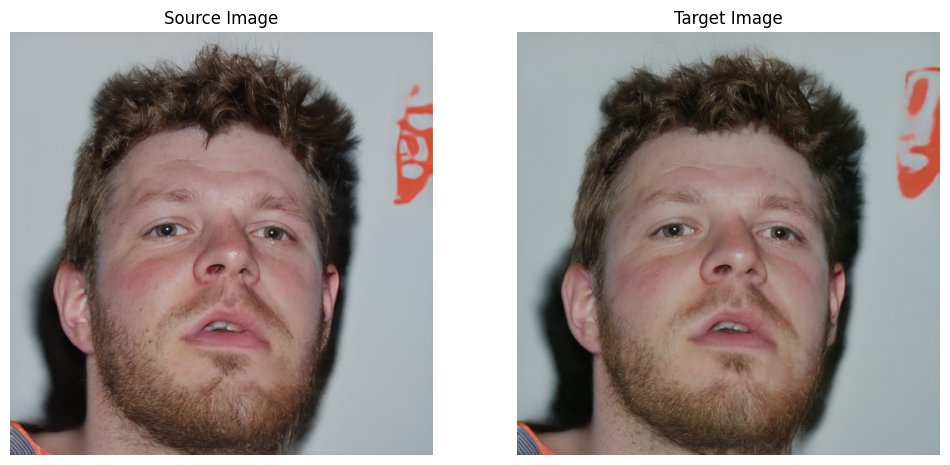

Step [100/300], Loss: 0.8096


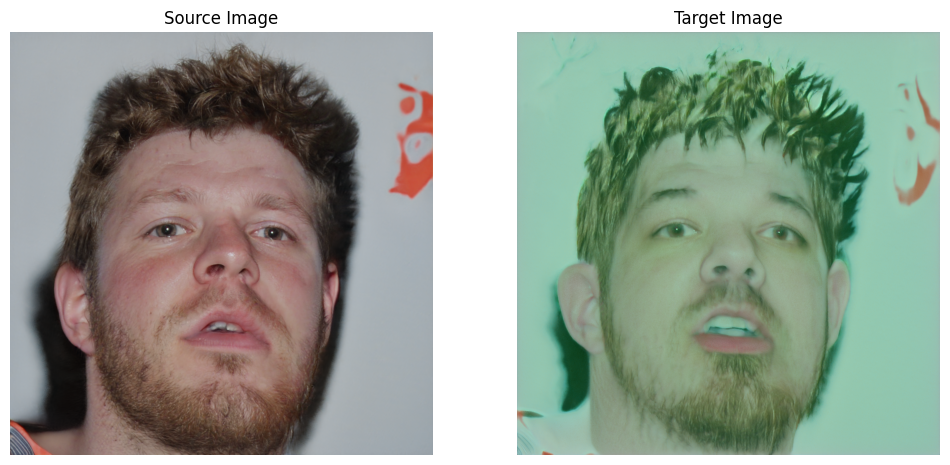

Step [200/300], Loss: 0.8521


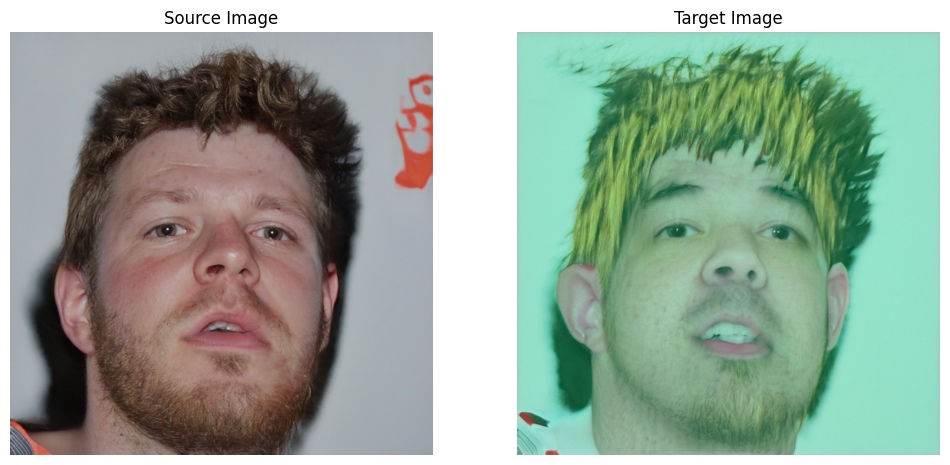

Step [299/300], Loss: 0.7715


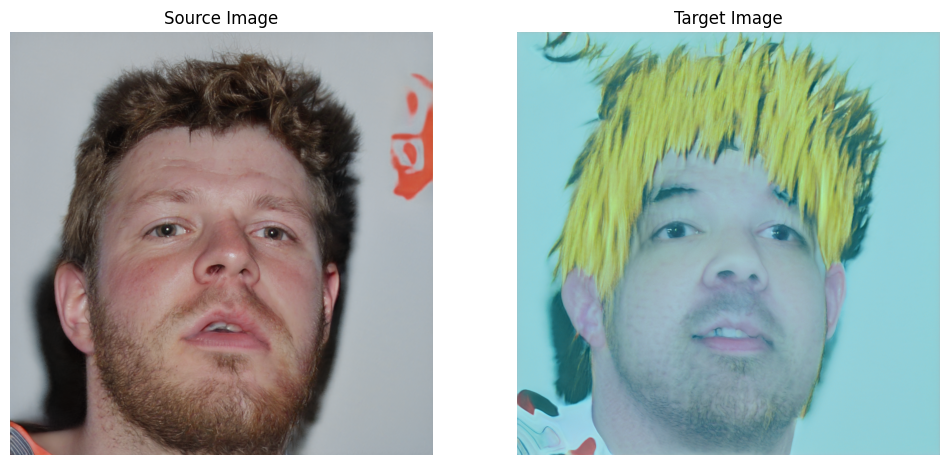


Training for prompt pair 2:
Source: 'a human face'
Target: 'a jocker face'
Step [0/300], Loss: 1.0088


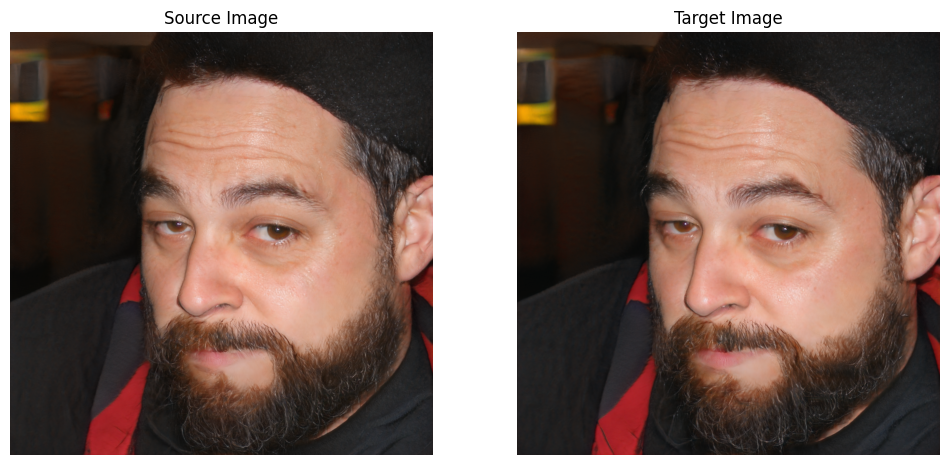

Step [100/300], Loss: 0.7803


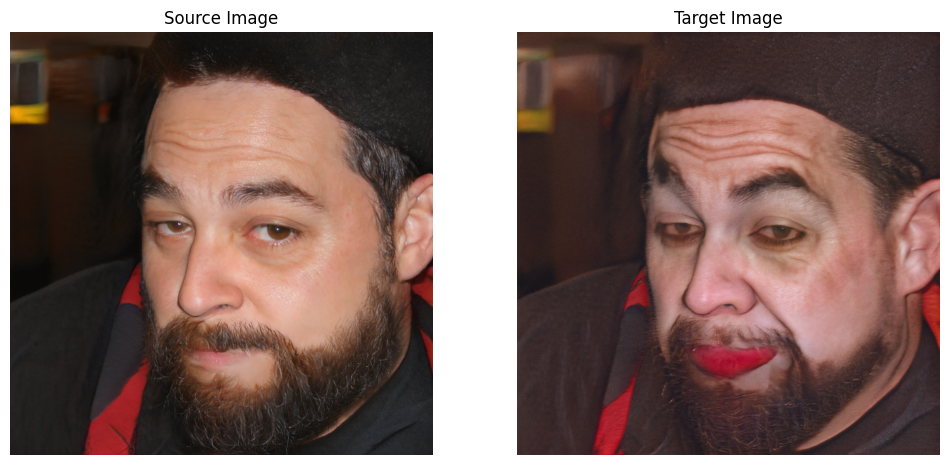

Step [200/300], Loss: 0.7334


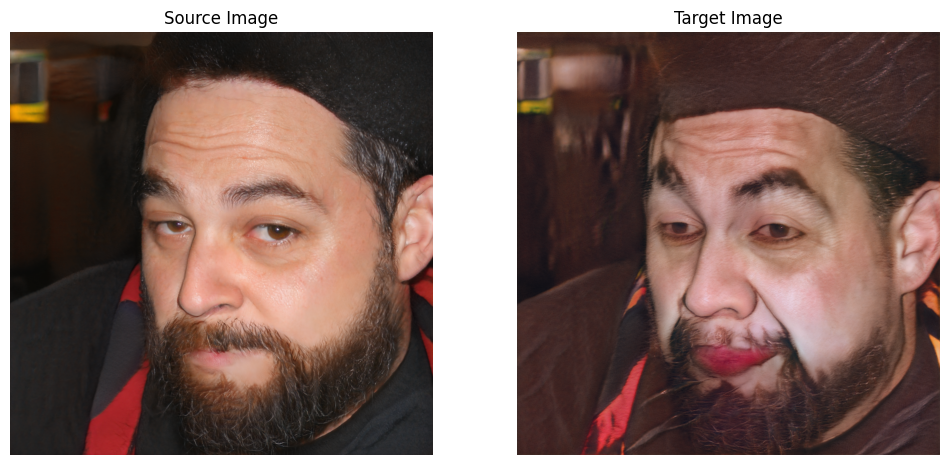

Step [299/300], Loss: 0.6885


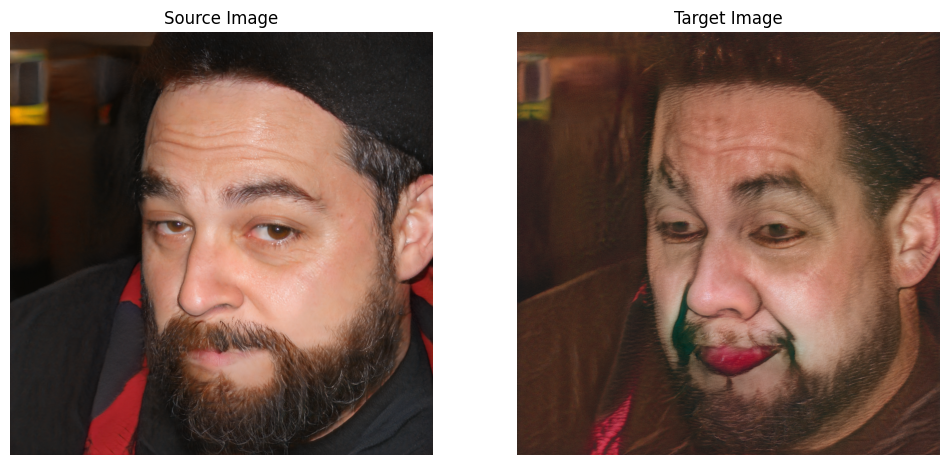


Training for prompt pair 3:
Source: 'a human face'
Target: 'a pixar 3D render'
Step [0/300], Loss: 1.0889


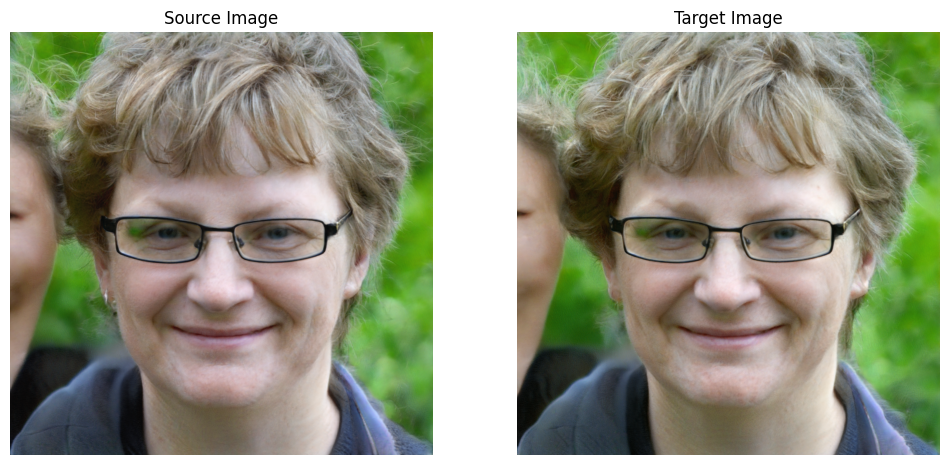

Step [100/300], Loss: 0.8853


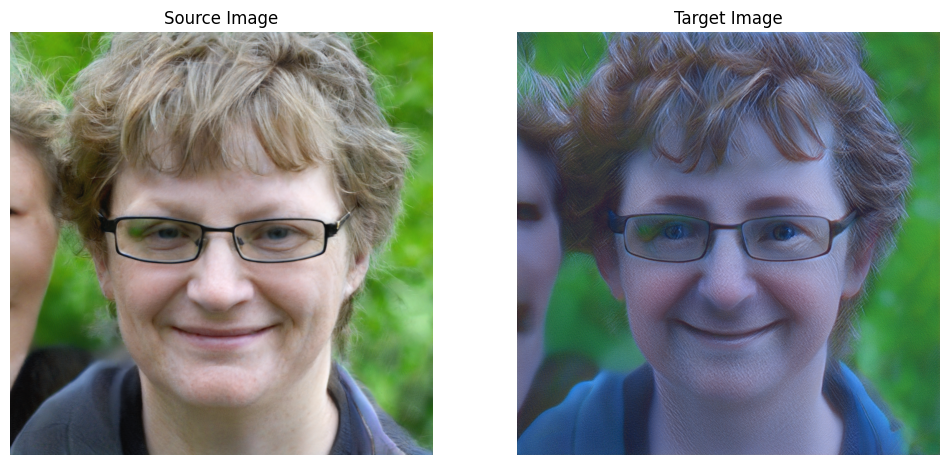

Step [200/300], Loss: 0.7915


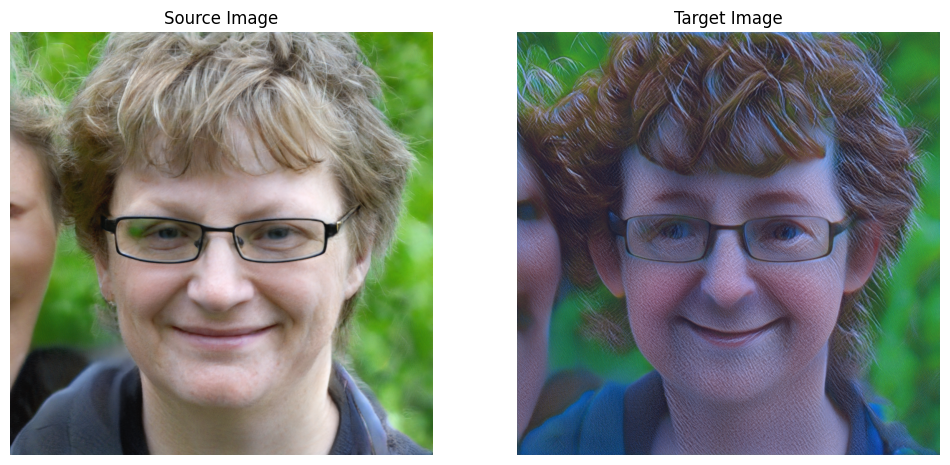

Step [299/300], Loss: 0.8291


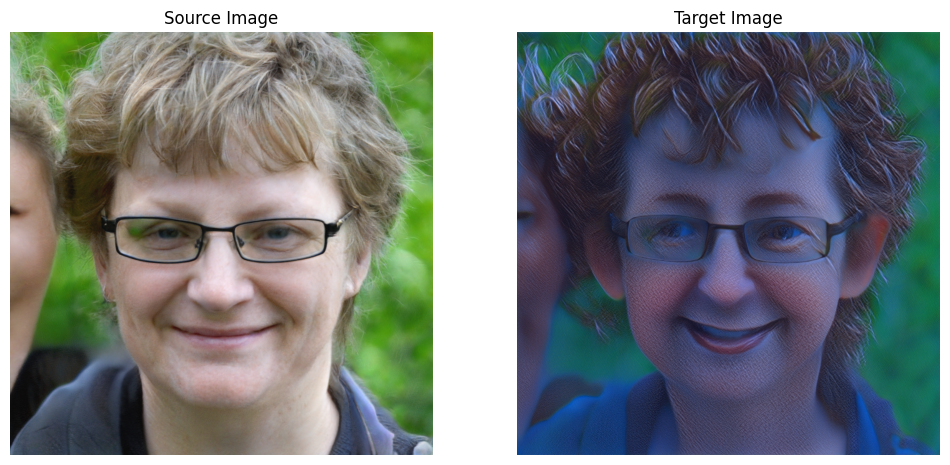


Training for prompt pair 4:
Source: 'a human face'
Target: 'a watercolor painting'
Step [0/300], Loss: 1.0137


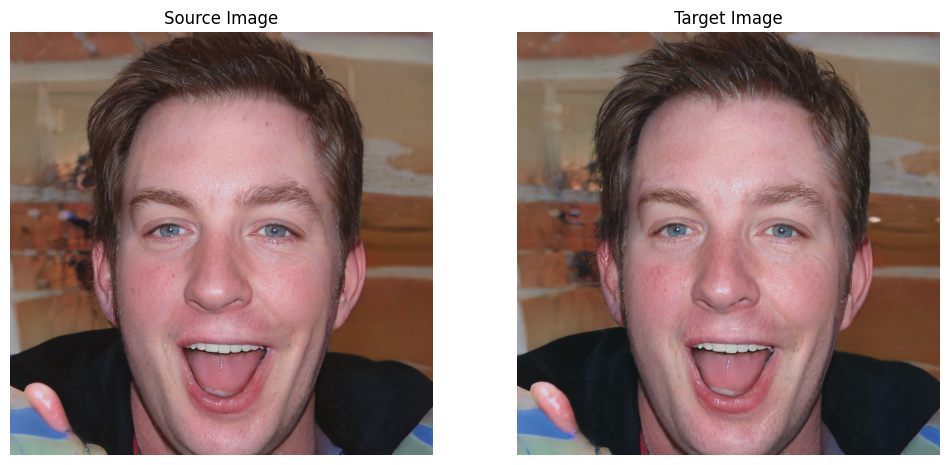

Step [100/300], Loss: 0.8452


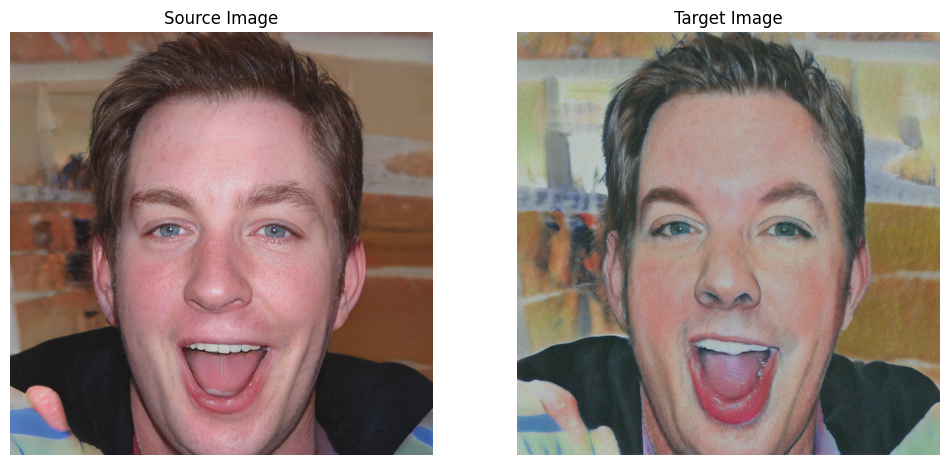

Step [200/300], Loss: 0.7993


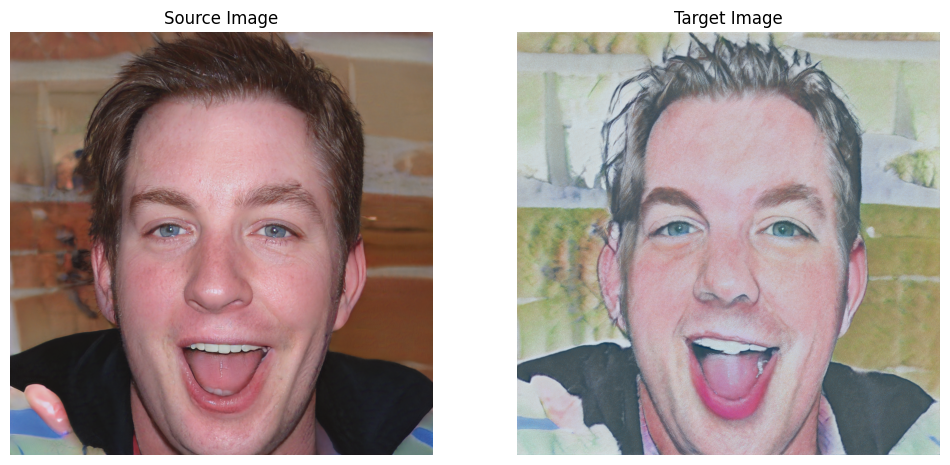

Step [299/300], Loss: 0.7642


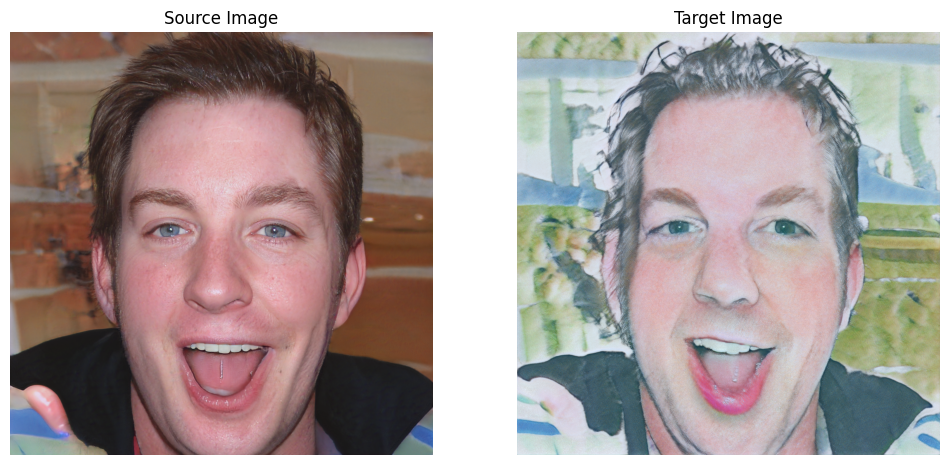


Training for prompt pair 5:
Source: 'a human face'
Target: 'a zombie face'
Step [0/300], Loss: 1.0410


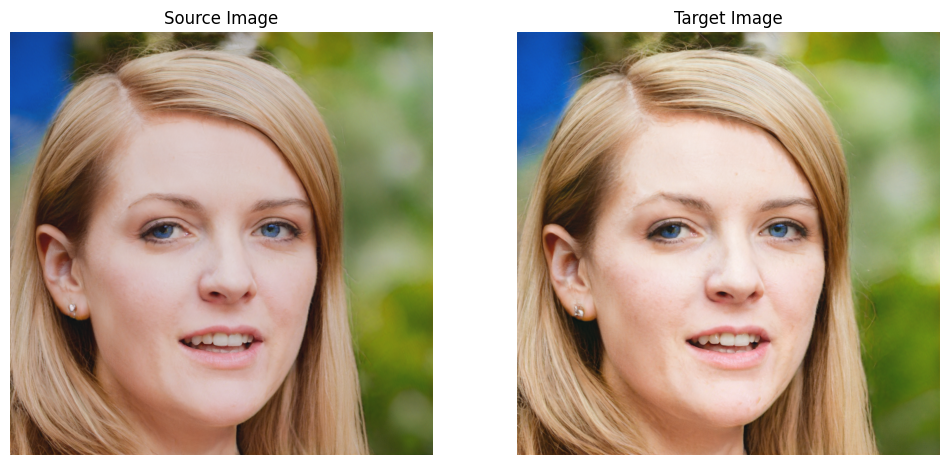

Step [100/300], Loss: 0.6973


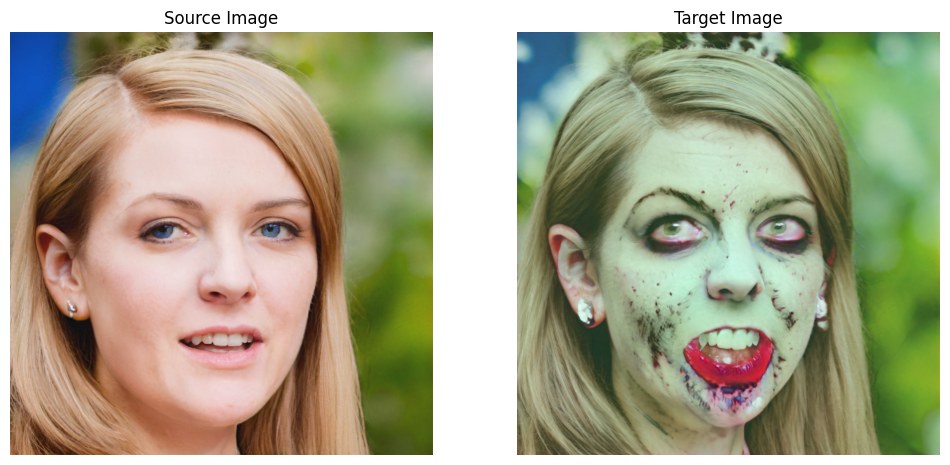

Step [200/300], Loss: 0.6641


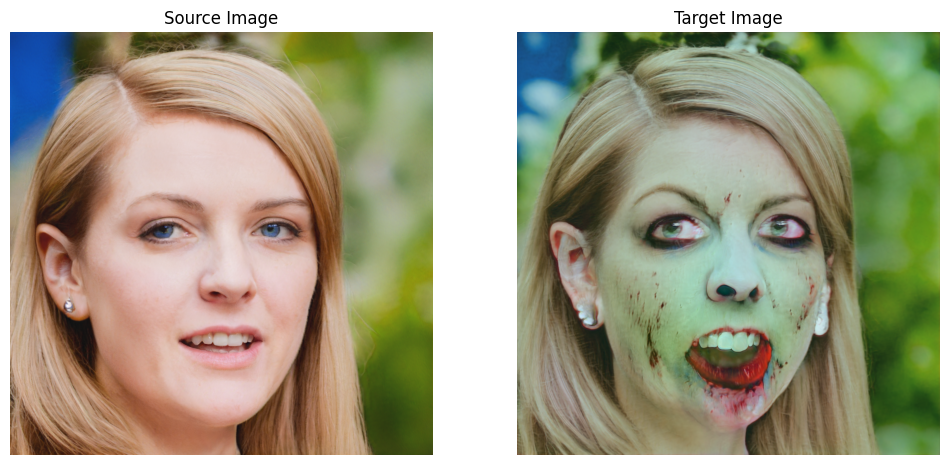

Step [299/300], Loss: 0.6699


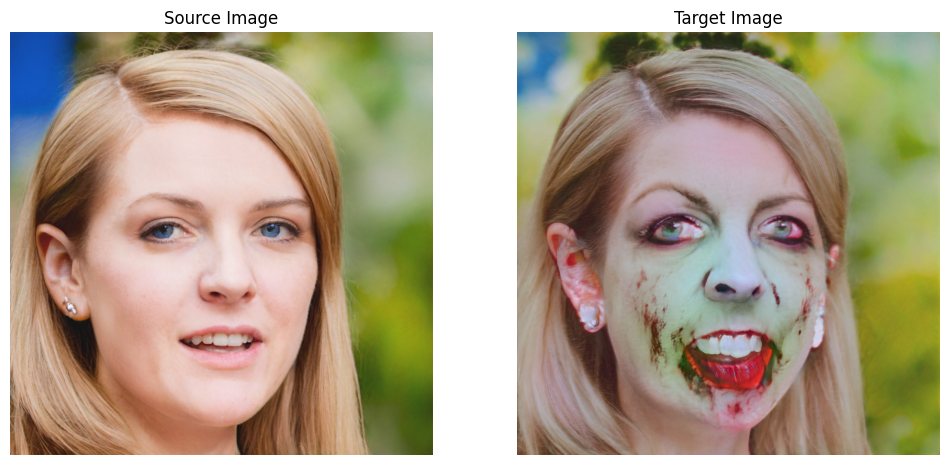


Training for prompt pair 6:
Source: 'a human face'
Target: 'a fantasy elf'
Step [0/300], Loss: 1.0039


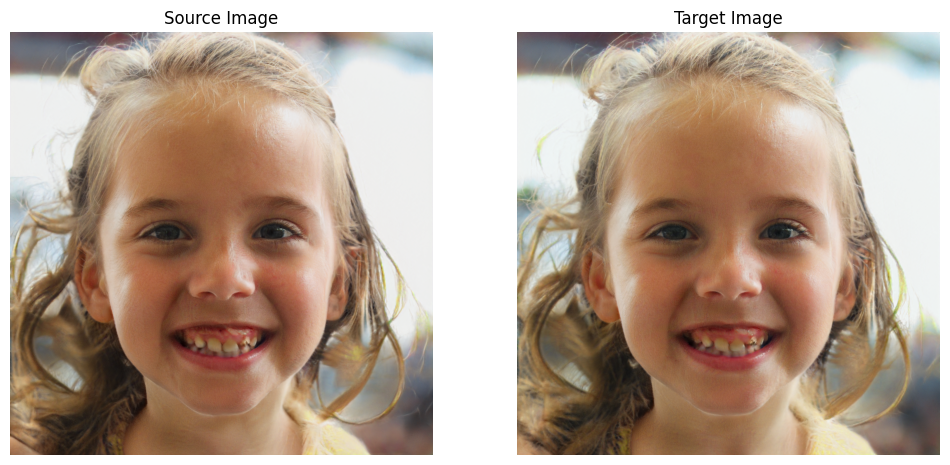

Step [100/300], Loss: 0.8257


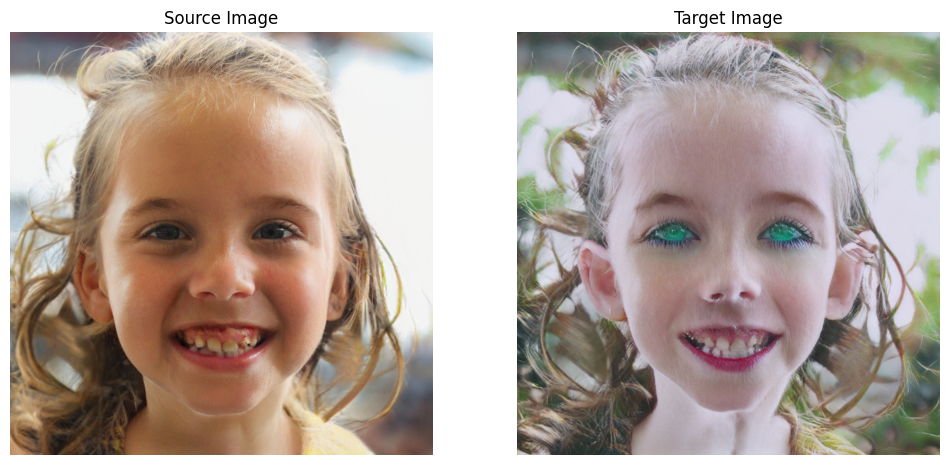

Step [200/300], Loss: 0.6797


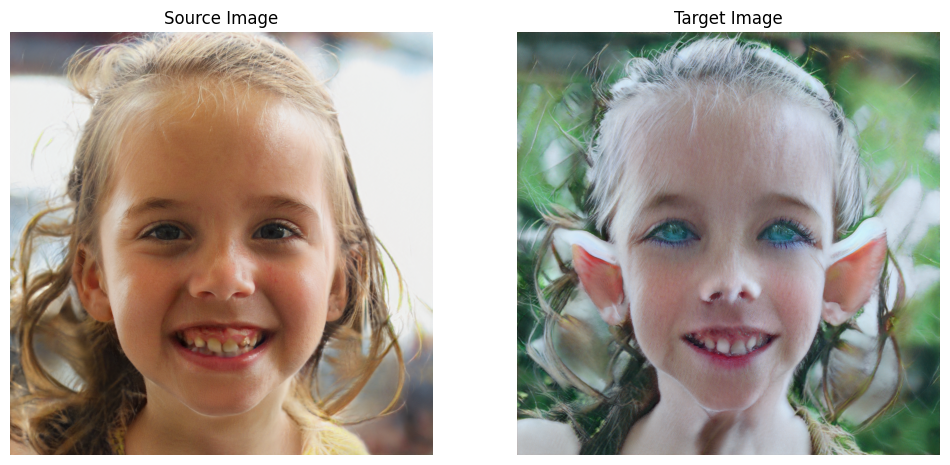

Step [299/300], Loss: 0.7119


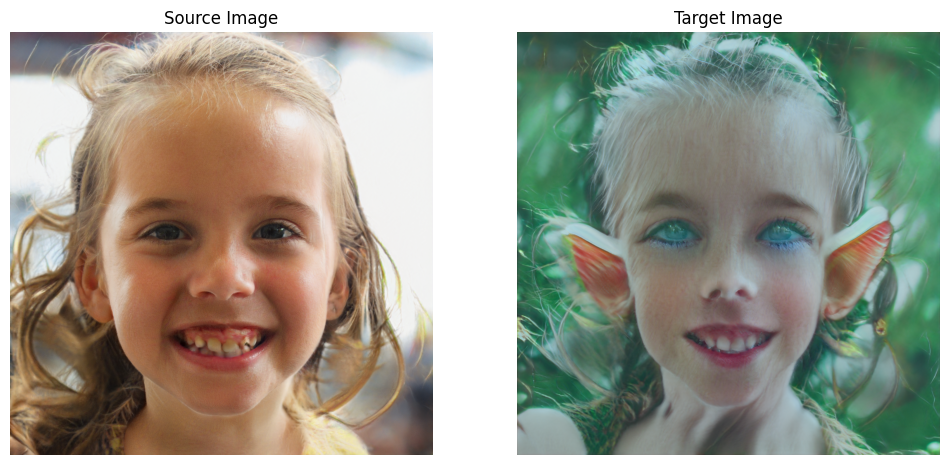

In [25]:
prompts = [
    ("a human face", "an anime character"),
    ("a human face", "a jocker face"),
    ("a human face", "a pixar 3D render"),
    ("a human face", "a watercolor painting"),
    ("a human face", "a zombie face"),
    ("a human face", "a fantasy elf")
]

for i, (source, target) in enumerate(prompts):
    print(f"\nTraining for prompt pair {i+1}:")
    print(f"Source: '{source}'")
    print(f"Target: '{target}'")

    generator_train.load_state_dict(generator_frozen.state_dict())
    generator_train.train()

    train_domain_adaptation(
        generator_frozen,
        generator_train,
        text_source=source,
        text_target=target,
        num_steps=300
    )

    torch.save(generator_train.state_dict(), f"generator_{target.replace(' ', '_')}.pt")
    torch.save(generator_train.state_dict(), f"../drive/MyDrive/StyleGAN_NADA_models/generator_{target.replace(' ', '_')}.pt")

In [26]:
print('done')

done
